In [1]:
# Load the data
import pandas as pd
df=pd.read_csv("boston.csv")

In [2]:
df.head()

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,HOUSEPRICE
0,0.00632,18.0,2.31,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [3]:
# pip install pandas-profiling

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# EDA

In [4]:
from pandas_profiling import ProfileReport

c:\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [34]:
# !pip install ipywidgets
ProfileReport(df)


[notice] A new release of pip available: 22.2.2 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


     -------------------------------------- 137.8/137.8 kB 4.1 MB/s eta 0:00:00
     ---------------------------------------- 2.0/2.0 MB 6.2 MB/s eta 0:00:00
     -------------------------------------- 384.3/384.3 kB 8.0 MB/s eta 0:00:00


Render HTML: 100%|██████████| 1/1 [00:16<00:00, 16.72s/it]


In [7]:
# separating outcome and features
x=df.drop(columns='HOUSEPRICE')
y=df.HOUSEPRICE

# split the data into train and test
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

#Standardise data
from sklearn.preprocessing import StandardScaler
st=StandardScaler()
st.fit(x_train)
st.fit(x_test)

x_train_std=st.transform(x_train)
x_test_std=st.transform(x_test)

In [6]:
x_train_std.shape

(379, 12)

In [ ]:
# !pip install livelossplot

In [8]:
# Build the model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense
from livelossplot import PlotLossesKerasTF

In [9]:
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam')

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden1 (Dense)             (None, 15)                195       
                                                                 
 Hidden2 (Dense)             (None, 15)                240       
                                                                 
 OutputLayer (Dense)         (None, 1)                 16        
                                                                 
Total params: 451
Trainable params: 451
Non-trainable params: 0
_________________________________________________________________


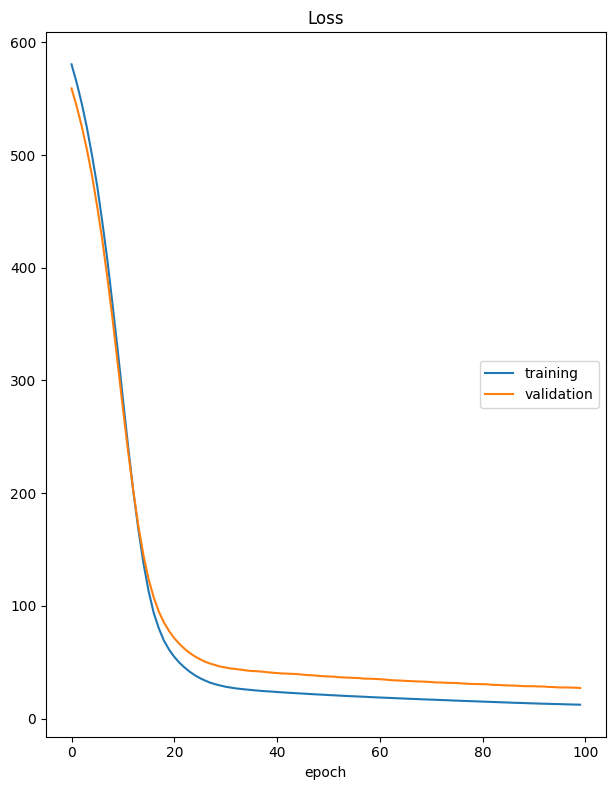

Loss
	training         	 (min:   12.338, max:  580.477, cur:   12.338)
	validation       	 (min:   27.185, max:  559.092, cur:   27.185)
12/12 [==============================] - 0s 32ms/step - loss: 12.3382 - val_loss: 27.1848


In [11]:
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [29]:
pred = model.predict(x_test_std)
# print(list(zip(pred,y_test)))

4/4 [==============================] - 0s 3ms/step
[(array([23.128874], dtype=float32), 22.6), (array([23.213198], dtype=float32), 50.0), (array([26.63619], dtype=float32), 23.0), (array([11.058902], dtype=float32), 8.3), (array([18.683237], dtype=float32), 21.2), (array([19.05592], dtype=float32), 19.9), (array([21.313148], dtype=float32), 20.6), (array([21.190386], dtype=float32), 18.7), (array([14.2645445], dtype=float32), 16.1), (array([7.739635], dtype=float32), 18.6), (array([6.4730062], dtype=float32), 8.8), (array([10.379367], dtype=float32), 17.2), (array([15.830118], dtype=float32), 14.9), (array([10.733877], dtype=float32), 10.5), (array([43.926254], dtype=float32), 50.0), (array([31.279505], dtype=float32), 29.0), (array([22.222952], dtype=float32), 23.0), (array([40.327442], dtype=float32), 33.3), (array([30.096384], dtype=float32), 29.4), (array([22.156038], dtype=float32), 21.0), (array([24.87549], dtype=float32), 23.8), (array([21.222906], dtype=float32), 19.1), (array(

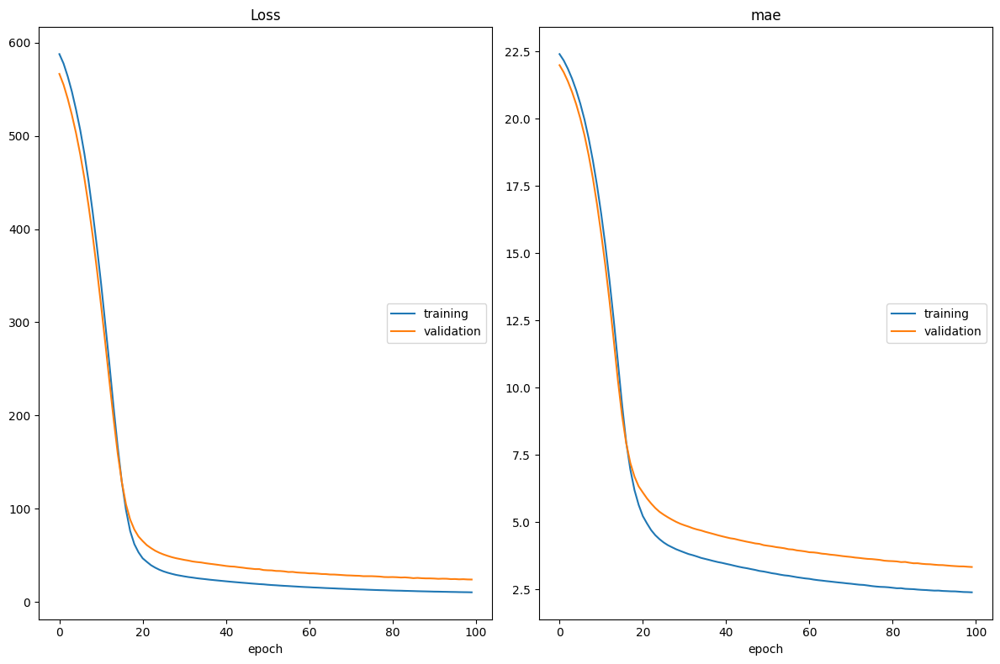

Loss
	training         	 (min:   10.439, max:  587.618, cur:   10.439)
	validation       	 (min:   24.158, max:  566.375, cur:   24.158)
mae
	training         	 (min:    2.387, max:   22.399, cur:    2.387)
	validation       	 (min:    3.328, max:   21.987, cur:    3.328)
12/12 [==============================] - 1s 47ms/step - loss: 10.4387 - mae: 2.3866 - val_loss: 24.1579 - val_mae: 3.3281


In [30]:
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [32]:
pred = model.predict(x_test_std)
print(list(zip(pred,y_test)))

4/4 [==============================] - 0s 2ms/step
[(array([24.244682], dtype=float32), 22.6), (array([26.928934], dtype=float32), 50.0), (array([25.114418], dtype=float32), 23.0), (array([12.191849], dtype=float32), 8.3), (array([17.891638], dtype=float32), 21.2), (array([19.168358], dtype=float32), 19.9), (array([21.81064], dtype=float32), 20.6), (array([22.629097], dtype=float32), 18.7), (array([15.037518], dtype=float32), 16.1), (array([14.863093], dtype=float32), 18.6), (array([8.87678], dtype=float32), 8.8), (array([10.430766], dtype=float32), 17.2), (array([14.878252], dtype=float32), 14.9), (array([10.653411], dtype=float32), 10.5), (array([44.04021], dtype=float32), 50.0), (array([34.64343], dtype=float32), 29.0), (array([23.642494], dtype=float32), 23.0), (array([40.12131], dtype=float32), 33.3), (array([31.331028], dtype=float32), 29.4), (array([22.076105], dtype=float32), 21.0), (array([23.536047], dtype=float32), 23.8), (array([20.70497], dtype=float32), 19.1), (array([18.

In [ ]:
# Increase number of layers
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(25,activation='relu',name="Hidden3"))
model.add(Dense(30,activation='relu',name="Hidden4"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [ ]:
# Perceptron
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [ ]:
# Increase number of layers
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(50,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [12]:
model.predict(x_test_std)

4/4 [==============================] - 0s 3ms/step


array([[23.128874 ],
       [23.213198 ],
       [26.63619  ],
       [11.058902 ],
       [18.683237 ],
       [19.05592  ],
       [21.313148 ],
       [21.190386 ],
       [14.2645445],
       [ 7.739635 ],
       [ 6.4730062],
       [10.379367 ],
       [15.830118 ],
       [10.733877 ],
       [43.926254 ],
       [31.279505 ],
       [22.222952 ],
       [40.327442 ],
       [30.096384 ],
       [22.156038 ],
       [24.87549  ],
       [21.222906 ],
       [19.708673 ],
       [27.816511 ],
       [21.779144 ],
       [20.737633 ],
       [16.431149 ],
       [15.866005 ],
       [41.16863  ],
       [17.766531 ],
       [14.56351  ],
       [18.068148 ],
       [16.72361  ],
       [20.891497 ],
       [28.69708  ],
       [19.559795 ],
       [ 8.46361  ],
       [22.773155 ],
       [13.305404 ],
       [11.832504 ],
       [26.335659 ],
       [21.129538 ],
       [19.385931 ],
       [15.513519 ],
       [21.883265 ],
       [26.03182  ],
       [19.112135 ],
       [17.98

In [12]:
y_test

329    22.6
371    50.0
219    23.0
403     8.3
78     21.2
       ... 
49     19.4
498    21.2
309    20.3
124    18.8
306    33.4
Name: HOUSEPRICE, Length: 127, dtype: float64

In [ ]:
# save model
model.save("BostonModel.h5")

In [ ]:
#from tensorflow.keras.models import load_model

In [13]:
df_new=pd.read_csv("boston new data.csv")

In [14]:
df_new

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.653,16,2.2,0,0.538,6.575,65.2,4.09,1,296,15.3,396.9,4.98
1,0.005,0,3.4,0,0.600,7.000,45.0,5.00,2,300,17.0,300.0,6.00


In [15]:
df_new.drop(columns="CHAS",inplace=True)

In [16]:
df_new_std=st.transform(df_new)

In [17]:
model.predict(df_new_std)

array([[29.830536],
       [24.459663]], dtype=float32)